# Purpose:
The purpose of this notebook is to create a simple linear regression model that uses gradient descent

In [1]:
import torch
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

In [2]:
# some functions

def pred(x,m,b): # prediction function
    y_pred = x*m + b
    return y_pred

def plot_line(x,y,m,b): # plotting function that shows the points and fitted line
    
    y_min = pred(x.min(),m,b).detach().item()
    y_max = pred(x.max(),m,b).detach().item() 
    
    x_min, x_max = x.min().detach().item(), x.max().detach().item()
    
    mse = torch.mean(torch.sum((y_pred - y)**2))
    
    plt.figure(figsize=(3,3))
    plt.scatter(x=x,y=y, label='true points')
    plt.plot([x_min,x_max],[y_min,y_max], label=f'line of fit - MSE: {mse:.3f}', c='orange')
    plt.legend()
    
def cost_mse(y_pred,y): # cost/loss function
    mse = torch.mean(torch.sum((y_pred - y)**2))
    return mse

In [3]:
# toy dataset

x = torch.tensor([0, 1, 2, 3, 4, 5, 6, 7.]) # feature 1
y = torch.tensor([1.86, 1.31, .62, .33, .09, -.67, -1.23, -1.37]) # target
x,y

(tensor([0., 1., 2., 3., 4., 5., 6., 7.]),
 tensor([ 1.8600,  1.3100,  0.6200,  0.3300,  0.0900, -0.6700, -1.2300, -1.3700]))

In [4]:
# random parameter initilization

torch.manual_seed(1)
m = torch.randn(1, requires_grad=True) # weight/coefficient

torch.manual_seed(1)
b = torch.randn(1, requires_grad=True) # bias/intercept

optimizer = torch.optim.SGD([m,b], lr=0.001) # optimizatin algorithm for gradient descent

m,b

(tensor([0.6614], requires_grad=True), tensor([0.6614], requires_grad=True))

In [5]:
# testing predictions

y_pred = pred(x,m,b)
y_pred

tensor([0.6614, 1.3227, 1.9841, 2.6454, 3.3068, 3.9681, 4.6295, 5.2908],
       grad_fn=<AddBackward0>)

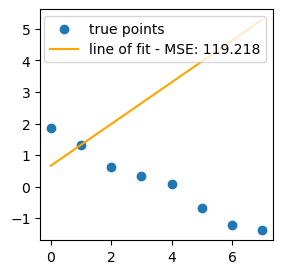

In [6]:
# testing the plots with the predictions

plot_line(x,y,m,b)

C:\Users\bjohn\AppData\Local\Temp\ipykernel_25612\3667740281.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(3,3))


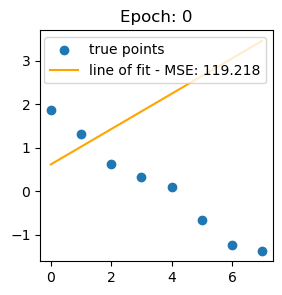

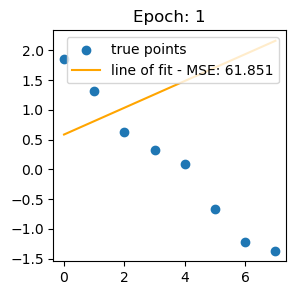

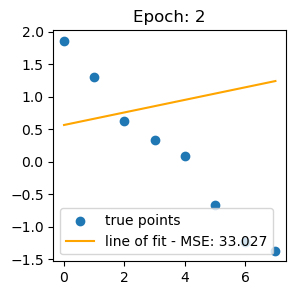

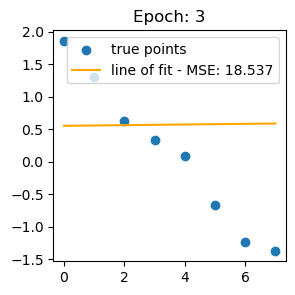

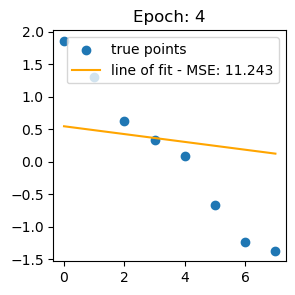

...

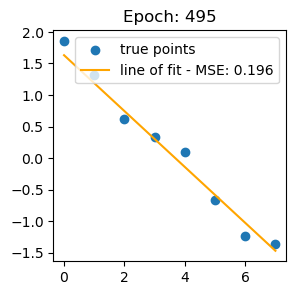

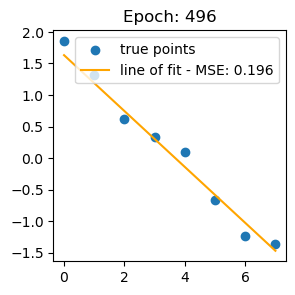

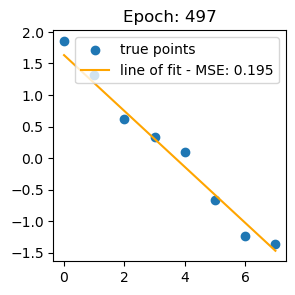

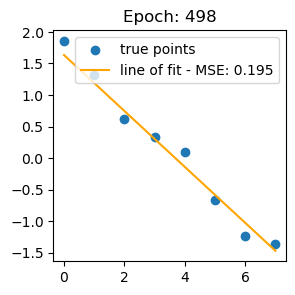

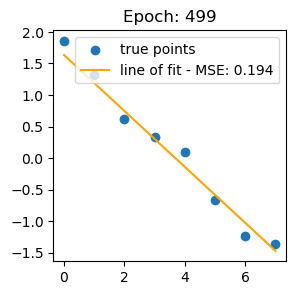

In [7]:
# gradient descent loop with plots to show the evolution of the fitted 
# line as the optimization function adjust the parameters

epochs = 500
for epoch in range(epochs):
    optimizer.zero_grad() # zeros out the gradients since they accumilate
    
    y_pred = pred(x,m,b) # predictions
    C = cost_mse(y_pred,y) # cost/loss function
    
    C.backward() # computes the gradients
    optimizer.step() # optimizes the parameters based on the gradients
    
    plot_line(x,y,m,b) # plots the points and fitted line
    plt.title(f'Epoch: {epoch}')